In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, Flatten, BatchNormalization, Conv2D, MaxPool2D, Dropout, LeakyReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.callbacks import ModelCheckpoint,Callback
from tensorflow.keras import Model
from tensorflow.keras import optimizers
import numpy as np
import keras
from skimage import io
from keras.utils import np_utils
from tensorflow import keras
from sklearn.metrics import confusion_matrix
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import itertools
import os
import shutil
import random
import glob
import matplotlib.pyplot as plt
import warnings
from keras import applications
from keras.models import Model
import keras
import cv2
import numpy as np
import os
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
import os 
import zipfile 
import tensorflow as tf 
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras import layers 
from tensorflow.keras import Model 
import matplotlib.pyplot as plt
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

In [2]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [3]:
tf.debugging.set_log_device_placement(True)

# Create some tensors
a = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
b = tf.constant([[1.0, 2.0], [3.0, 4.0], [5.0, 6.0]])
c = tf.matmul(a, b)

print(c)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op MatMul in device /job:localhost/replica:0/task:0/device:GPU:0
tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32)


In [4]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
  try:
    tf.config.set_visible_devices(gpus[0], 'GPU')
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
  except RuntimeError as e:
    # Visible devices must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPU


# Data Processing

In [5]:
data_dir = 'final_dataset/'
lis_dir = []
def dataset_split(dataset):
    lis_dir = os.listdir(data_dir)
    if(dataset == 'celeb_df'):
        return(data_dir+lis_dir[0]+'/')
    elif(dataset == 'ddff'):
        return(data_dir+lis_dir[1]+'/')
    elif(dataset == 'ff++'):
        return(data_dir+lis_dir[2]+'/')
    else:
        return print("Wrong Dataset Name")
    

In [6]:
batch_size = 32
img_height = 224
img_width = 224
datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=False,vertical_flip=False, validation_split=0.2) # set validation split

def train_dp(data_dir):
    train_gen = datagen.flow_from_directory(directory=data_dir, target_size=(224,224), 
                                            class_mode='binary',batch_size=32,subset='training')
    return train_gen

def val_dp(data_dir):
    val_gen = datagen.flow_from_directory(directory=data_dir, target_size=(224,224), 
                                          class_mode='binary',batch_size=32,subset='validation')
    return val_gen
    
    

# Building Inception_v3 Model

In [7]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
base_model = InceptionV3(input_shape = (224, 224, 3), include_top = False, weights = 'imagenet')

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/ta

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/de

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:local

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:local

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:local

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/rep

Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/rep

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:loca

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0


In [8]:
for layer in base_model.layers:
    layer.trainable = False

In [9]:
from keras import regularizers

x = layers.Flatten()(base_model.output)
x = layers.Dense(1024, kernel_regularizer=regularizers.l2(0.0001), activation='relu')(x)
x = layers.Dropout(0.5)(x)

# Add a final sigmoid layer with 1 node for classification output
x = layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.models.Model(base_model.input, x)

model.compile(optimizer = RMSprop(learning_rate=0.0001), loss = 'binary_crossentropy', metrics = ['acc'])

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica

In [10]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 111, 111, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 111, 111, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [12]:
dot_img_file = 'Inception_model_.png'
tf.keras.utils.plot_model(model, to_file=dot_img_file, show_shapes=True)

In [ ]:
#early stopping to monitor the validation loss and avoid overfitting
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)

#reducing learning rate on plateau
rlrop = ReduceLROnPlateau(monitor='val_loss', mode='min', patience= 5, factor= 0.5, min_lr= 1e-6, verbose=1)

# Train with CELB_df Dataset

In [11]:
train_ds = train_dp(dataset_split('celeb_df'))
val_ds = val_dp(dataset_split('celeb_df'))

Found 18006 images belonging to 2 classes.
Found 4500 images belonging to 2 classes.


In [12]:
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 10, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

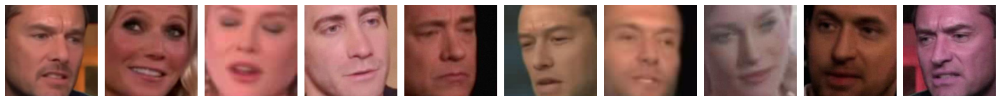

[0. 1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.
 0. 0. 0. 0. 1. 0. 0. 0.]


In [13]:
imgs, labels = next(train_ds)
plotImages(imgs)
print(labels)

In [14]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
checkpoint = ModelCheckpoint('Inception_v3_models/Inception_v3.h5', monitor='val_acc', verbose=1, save_best_only=True, mode='max')
early = EarlyStopping(monitor='val_acc', min_delta=0, patience=20, verbose=1, mode='auto')

history = model.fit(x=train_ds, steps_per_epoch=len(train_ds),validation_data=val_ds, 
                         validation_steps=len(val_ds), epochs=30, callbacks=[checkpoint,early])

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeI

110/563 [====>.........................] - ETA: 49s - loss: 1.4277 - acc: 0.6613Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


200/563 [=========>....................] - ETA: 39s - loss: 1.1038 - acc: 0.6858Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


290/563 [==============>...............] - ETA: 28s - loss: 0.9525 - acc: 0.6997Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


380/563 [===================>..........] - ETA: 18s - loss: 0.8848 - acc: 0.7024Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


470/563 [========================>.....] - ETA: 9s - loss: 0.8355 - acc: 0.7070Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


516/563 [==========================>...] - ETA: 4s - loss: 0.8061 - acc: 0.7143Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


562/563 [============================>.] - ETA: 0s - loss: 0.7825 - acc: 0.7194Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.7826 - acc: 0.7193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIt

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

106/563 [====>.........................] - ETA: 42s - loss: 0.4639 - acc: 0.8040Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


196/563 [=========>....................] - ETA: 34s - loss: 0.4568 - acc: 0.8106Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


286/563 [==============>...............] - ETA: 25s - loss: 0.4558 - acc: 0.8095Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


376/563 [===================>..........] - ETA: 17s - loss: 0.4513 - acc: 0.8103Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


466/563 [=======================>......] - ETA: 9s - loss: 0.4436 - acc: 0.8143Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


512/563 [==========================>...] - ETA: 4s - loss: 0.4373 - acc: 0.8164Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


558/563 [============================>.] - ETA: 0s - loss: 0.4338 - acc: 0.8181Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.4348 - acc: 0.8176Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 3/30
Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/563 [=>............................] - ETA: 48s - loss: 0.3796 - acc: 0.8476Executing op __inference_train_function_12538 in device /job:loca

131/563 [=====>........................] - ETA: 40s - loss: 0.3532 - acc: 0.8552Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


221/563 [==========>...................] - ETA: 32s - loss: 0.3494 - acc: 0.8596Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


311/563 [===============>..............] - ETA: 23s - loss: 0.3479 - acc: 0.8597Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


401/563 [====================>.........] - ETA: 15s - loss: 0.3420 - acc: 0.8630Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


492/563 [=========================>....] - ETA: 6s - loss: 0.3399 - acc: 0.8651Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


538/563 [===========================>..] - ETA: 2s - loss: 0.3410 - acc: 0.8649Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.3398 - acc: 0.8653Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 4/30
Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0
 86/563 [===>..........................] - ETA: 44s - loss: 0.2614 - acc: 0.9023Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


176/563 [========>.....................] - ETA: 36s - loss: 0.2716 - acc: 0.8952Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


266/563 [=============>................] - ETA: 27s - loss: 0.2760 - acc: 0.8944Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


356/563 [=================>............] - ETA: 19s - loss: 0.2708 - acc: 0.8975Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


446/563 [======================>.......] - ETA: 10s - loss: 0.2693 - acc: 0.8974Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


492/563 [=========================>....] - ETA: 6s - loss: 0.2700 - acc: 0.8977Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


538/563 [===========================>..] - ETA: 2s - loss: 0.2715 - acc: 0.8968Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.2706 - acc: 0.8975Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 5/30
Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0
 86/563 [===>..........................] - ETA: 44s - loss: 0.2197 - acc: 0.9248Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


176/563 [========>.....................] - ETA: 35s - loss: 0.2326 - acc: 0.9155Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


266/563 [=============>................] - ETA: 27s - loss: 0.2267 - acc: 0.9185Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


356/563 [=================>............] - ETA: 19s - loss: 0.2269 - acc: 0.9190Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


446/563 [======================>.......] - ETA: 10s - loss: 0.2267 - acc: 0.9198Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


492/563 [=========================>....] - ETA: 6s - loss: 0.2261 - acc: 0.9206Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


538/563 [===========================>..] - ETA: 2s - loss: 0.2258 - acc: 0.9210Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.2263 - acc: 0.9209Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 6/30
Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0
 86/563 [===>..........................] - ETA: 44s - loss: 0.1890 - acc: 0.9382Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


176/563 [========>.....................] - ETA: 36s - loss: 0.1913 - acc: 0.9345Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


266/563 [=============>................] - ETA: 27s - loss: 0.1926 - acc: 0.9361Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


356/563 [=================>............] - ETA: 19s - loss: 0.1923 - acc: 0.9363Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


446/563 [======================>.......] - ETA: 10s - loss: 0.1899 - acc: 0.9367Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


492/563 [=========================>....] - ETA: 6s - loss: 0.1907 - acc: 0.9365Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


538/563 [===========================>..] - ETA: 2s - loss: 0.1917 - acc: 0.9369Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.1926 - acc: 0.9366Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


111/563 [====>.........................] - ETA: 42s - loss: 0.1567 - acc: 0.9535Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


201/563 [=========>....................] - ETA: 34s - loss: 0.1660 - acc: 0.9499Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


291/563 [==============>...............] - ETA: 25s - loss: 0.1637 - acc: 0.9499Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


381/563 [===================>..........] - ETA: 17s - loss: 0.1643 - acc: 0.9497Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


471/563 [========================>.....] - ETA: 8s - loss: 0.1666 - acc: 0.9488Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


517/563 [==========================>...] - ETA: 4s - loss: 0.1664 - acc: 0.9494Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.1684 - acc: 0.9481Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Exec

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


135/563 [======>.......................] - ETA: 40s - loss: 0.1539 - acc: 0.9551Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


225/563 [==========>...................] - ETA: 31s - loss: 0.1449 - acc: 0.9588Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


315/563 [===============>..............] - ETA: 23s - loss: 0.1444 - acc: 0.9591Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


405/563 [====================>.........] - ETA: 14s - loss: 0.1448 - acc: 0.9588Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


496/563 [=========================>....] - ETA: 6s - loss: 0.1454 - acc: 0.9577Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


542/563 [===========================>..] - ETA: 1s - loss: 0.1450 - acc: 0.9578Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.1448 - acc: 0.9579Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 90/563 [===>..........................] - ETA: 44s - loss: 0.1386 - acc: 0.9622Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


180/563 [========>.....................] - ETA: 35s - loss: 0.1332 - acc: 0.9630Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


270/563 [=============>................] - ETA: 27s - loss: 0.1324 - acc: 0.9634Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


360/563 [==================>...........] - ETA: 19s - loss: 0.1303 - acc: 0.9646Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


450/563 [======================>.......] - ETA: 10s - loss: 0.1312 - acc: 0.9644Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


496/563 [=========================>....] - ETA: 6s - loss: 0.1315 - acc: 0.9645Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


542/563 [===========================>..] - ETA: 1s - loss: 0.1299 - acc: 0.9654Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.1306 - acc: 0.9650Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


159/563 [=======>......................] - ETA: 37s - loss: 0.1179 - acc: 0.9699Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


249/563 [============>.................] - ETA: 29s - loss: 0.1181 - acc: 0.9696Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


339/563 [=================>............] - ETA: 20s - loss: 0.1202 - acc: 0.9697Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


429/563 [=====================>........] - ETA: 12s - loss: 0.1197 - acc: 0.9697Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


520/563 [==========================>...] - ETA: 4s - loss: 0.1188 - acc: 0.9705Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.1184 - acc: 0.9705Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __infer

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


 93/563 [===>..........................] - ETA: 43s - loss: 0.1056 - acc: 0.9735Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


183/563 [========>.....................] - ETA: 35s - loss: 0.1080 - acc: 0.9746Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


273/563 [=============>................] - ETA: 27s - loss: 0.1075 - acc: 0.9749Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


363/563 [==================>...........] - ETA: 18s - loss: 0.1109 - acc: 0.9741Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


453/563 [=======================>......] - ETA: 10s - loss: 0.1114 - acc: 0.9740Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


499/563 [=========================>....] - ETA: 6s - loss: 0.1116 - acc: 0.9737Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


545/563 [============================>.] - ETA: 1s - loss: 0.1118 - acc: 0.9738Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.1116 - acc: 0.9740Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


162/563 [=======>......................] - ETA: 37s - loss: 0.0993 - acc: 0.9786Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


252/563 [============>.................] - ETA: 29s - loss: 0.1014 - acc: 0.9783Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


342/563 [=================>............] - ETA: 20s - loss: 0.1010 - acc: 0.9779Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


432/563 [======================>.......] - ETA: 12s - loss: 0.1030 - acc: 0.9767Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


523/563 [==========================>...] - ETA: 3s - loss: 0.1046 - acc: 0.9764Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.1038 - acc: 0.9767Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


 96/563 [====>.........................] - ETA: 43s - loss: 0.1019 - acc: 0.9782Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


186/563 [========>.....................] - ETA: 35s - loss: 0.0977 - acc: 0.9783Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


276/563 [=============>................] - ETA: 26s - loss: 0.0970 - acc: 0.9780Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


366/563 [==================>...........] - ETA: 18s - loss: 0.0969 - acc: 0.9781Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


456/563 [=======================>......] - ETA: 10s - loss: 0.0986 - acc: 0.9778Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


502/563 [=========================>....] - ETA: 5s - loss: 0.0985 - acc: 0.9778Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


548/563 [============================>.] - ETA: 1s - loss: 0.0990 - acc: 0.9775Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0980 - acc: 0.9780Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


165/563 [=======>......................] - ETA: 37s - loss: 0.0872 - acc: 0.9809Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


255/563 [============>.................] - ETA: 28s - loss: 0.0916 - acc: 0.9791Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


345/563 [=================>............] - ETA: 20s - loss: 0.0900 - acc: 0.9796Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


435/563 [======================>.......] - ETA: 11s - loss: 0.0918 - acc: 0.9794Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


526/563 [===========================>..] - ETA: 3s - loss: 0.0925 - acc: 0.9794Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0940 - acc: 0.9788Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


143/563 [======>.......................] - ETA: 39s - loss: 0.0826 - acc: 0.9855Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


233/563 [===========>..................] - ETA: 30s - loss: 0.0863 - acc: 0.9837Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


323/563 [================>.............] - ETA: 22s - loss: 0.0856 - acc: 0.9831Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


413/563 [=====================>........] - ETA: 14s - loss: 0.0873 - acc: 0.9827Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


504/563 [=========================>....] - ETA: 5s - loss: 0.0879 - acc: 0.9821Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


550/563 [============================>.] - ETA: 1s - loss: 0.0887 - acc: 0.9816Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0887 - acc: 0.9814Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


167/563 [=======>......................] - ETA: 37s - loss: 0.0838 - acc: 0.9818Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


257/563 [============>.................] - ETA: 28s - loss: 0.0844 - acc: 0.9825Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


347/563 [=================>............] - ETA: 20s - loss: 0.0835 - acc: 0.9830Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


437/563 [======================>.......] - ETA: 11s - loss: 0.0853 - acc: 0.9817Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


528/563 [===========================>..] - ETA: 3s - loss: 0.0849 - acc: 0.9822Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0844 - acc: 0.9825Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


101/563 [====>.........................] - ETA: 43s - loss: 0.0880 - acc: 0.9814Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


191/563 [=========>....................] - ETA: 34s - loss: 0.0852 - acc: 0.9823Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


281/563 [=============>................] - ETA: 26s - loss: 0.0852 - acc: 0.9832Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


371/563 [==================>...........] - ETA: 18s - loss: 0.0848 - acc: 0.9830Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


461/563 [=======================>......] - ETA: 9s - loss: 0.0848 - acc: 0.9830Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


507/563 [==========================>...] - ETA: 5s - loss: 0.0852 - acc: 0.9829Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


553/563 [============================>.] - ETA: 0s - loss: 0.0851 - acc: 0.9825Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0851 - acc: 0.9825Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
563/563 [==============================] - 63s 111ms/step - loss: 0.0851 - acc: 0.9825 - val_loss: 1.6315 - val_acc: 0.6498

Epoch 00017: val_acc did not improve from 0.66089
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/dev

170/563 [========>.....................] - ETA: 36s - loss: 0.0795 - acc: 0.9851Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


260/563 [============>.................] - ETA: 28s - loss: 0.0791 - acc: 0.9850Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


350/563 [=================>............] - ETA: 19s - loss: 0.0773 - acc: 0.9854Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


440/563 [======================>.......] - ETA: 11s - loss: 0.0805 - acc: 0.9841Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


531/563 [===========================>..] - ETA: 2s - loss: 0.0807 - acc: 0.9840Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0819 - acc: 0.9835Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


148/563 [======>.......................] - ETA: 39s - loss: 0.0767 - acc: 0.9823Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


238/563 [===========>..................] - ETA: 30s - loss: 0.0756 - acc: 0.9837Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


328/563 [================>.............] - ETA: 22s - loss: 0.0793 - acc: 0.9831Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


418/563 [=====================>........] - ETA: 13s - loss: 0.0801 - acc: 0.9834Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


509/563 [==========================>...] - ETA: 5s - loss: 0.0802 - acc: 0.9833Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


555/563 [============================>.] - ETA: 0s - loss: 0.0809 - acc: 0.9831Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0806 - acc: 0.9833Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
563/563 [==============================] - 63s 111ms/step - loss: 0.0806 - acc: 0.9833 - val_loss: 1.6397 - val_acc: 0.6504

Epoch 00019: val_acc did not improve from 0.66089
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:

172/563 [========>.....................] - ETA: 36s - loss: 0.0749 - acc: 0.9847Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


262/563 [============>.................] - ETA: 28s - loss: 0.0767 - acc: 0.9850Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


352/563 [=================>............] - ETA: 19s - loss: 0.0767 - acc: 0.9847Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


442/563 [======================>.......] - ETA: 11s - loss: 0.0763 - acc: 0.9845Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


533/563 [===========================>..] - ETA: 2s - loss: 0.0774 - acc: 0.9839Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0784 - acc: 0.9834Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


106/563 [====>.........................] - ETA: 42s - loss: 0.0696 - acc: 0.9891Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


196/563 [=========>....................] - ETA: 34s - loss: 0.0727 - acc: 0.9872Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


286/563 [==============>...............] - ETA: 26s - loss: 0.0711 - acc: 0.9872Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


376/563 [===================>..........] - ETA: 17s - loss: 0.0721 - acc: 0.9863Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


466/563 [=======================>......] - ETA: 9s - loss: 0.0735 - acc: 0.9860Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


512/563 [==========================>...] - ETA: 4s - loss: 0.0736 - acc: 0.9857Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


558/563 [============================>.] - ETA: 0s - loss: 0.0744 - acc: 0.9858Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0743 - acc: 0.9859Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 22/30
Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/563 [=>............................] - ETA: 48s - loss: 0.0620 - acc: 0.9886Executing op __inference_train_function_12538 in device /job:loc

131/563 [=====>........................] - ETA: 40s - loss: 0.0655 - acc: 0.9881Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


221/563 [==========>...................] - ETA: 32s - loss: 0.0718 - acc: 0.9856Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


311/563 [===============>..............] - ETA: 23s - loss: 0.0733 - acc: 0.9854Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


401/563 [====================>.........] - ETA: 15s - loss: 0.0731 - acc: 0.9859Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


492/563 [=========================>....] - ETA: 6s - loss: 0.0752 - acc: 0.9856Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


538/563 [===========================>..] - ETA: 2s - loss: 0.0752 - acc: 0.9855Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0760 - acc: 0.9853Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


111/563 [====>.........................] - ETA: 42s - loss: 0.0731 - acc: 0.9854Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


201/563 [=========>....................] - ETA: 33s - loss: 0.0744 - acc: 0.9859Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


291/563 [==============>...............] - ETA: 25s - loss: 0.0737 - acc: 0.9861Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


381/563 [===================>..........] - ETA: 17s - loss: 0.0737 - acc: 0.9857Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


471/563 [========================>.....] - ETA: 8s - loss: 0.0763 - acc: 0.9855Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


517/563 [==========================>...] - ETA: 4s - loss: 0.0758 - acc: 0.9854Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0758 - acc: 0.9853Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Exec

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


135/563 [======>.......................] - ETA: 39s - loss: 0.0655 - acc: 0.9900Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


225/563 [==========>...................] - ETA: 31s - loss: 0.0704 - acc: 0.9876Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


315/563 [===============>..............] - ETA: 23s - loss: 0.0732 - acc: 0.9869Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


405/563 [====================>.........] - ETA: 14s - loss: 0.0721 - acc: 0.9875Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


496/563 [=========================>....] - ETA: 6s - loss: 0.0725 - acc: 0.9870Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


542/563 [===========================>..] - ETA: 1s - loss: 0.0721 - acc: 0.9870Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0717 - acc: 0.9870Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


159/563 [=======>......................] - ETA: 38s - loss: 0.0720 - acc: 0.9868Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


249/563 [============>.................] - ETA: 29s - loss: 0.0726 - acc: 0.9872Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


339/563 [=================>............] - ETA: 21s - loss: 0.0724 - acc: 0.9874Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


429/563 [=====================>........] - ETA: 12s - loss: 0.0741 - acc: 0.9865Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


520/563 [==========================>...] - ETA: 4s - loss: 0.0728 - acc: 0.9868Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0733 - acc: 0.9864Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __infer

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


 93/563 [===>..........................] - ETA: 44s - loss: 0.0682 - acc: 0.9882Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


183/563 [========>.....................] - ETA: 35s - loss: 0.0696 - acc: 0.9875Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


273/563 [=============>................] - ETA: 27s - loss: 0.0666 - acc: 0.9886Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


363/563 [==================>...........] - ETA: 18s - loss: 0.0663 - acc: 0.9889Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


453/563 [=======================>......] - ETA: 10s - loss: 0.0683 - acc: 0.9883Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


499/563 [=========================>....] - ETA: 6s - loss: 0.0688 - acc: 0.9878Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


545/563 [============================>.] - ETA: 1s - loss: 0.0700 - acc: 0.9877Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0699 - acc: 0.9878Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 93/563 [===>..........................] - ETA: 44s - loss: 0.0618 - acc: 0.9906Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


183/563 [========>.....................] - ETA: 35s - loss: 0.0719 - acc: 0.9860Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


273/563 [=============>................] - ETA: 27s - loss: 0.0707 - acc: 0.9867Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


363/563 [==================>...........] - ETA: 18s - loss: 0.0715 - acc: 0.9866Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


453/563 [=======================>......] - ETA: 10s - loss: 0.0730 - acc: 0.9865Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


499/563 [=========================>....] - ETA: 5s - loss: 0.0718 - acc: 0.9869Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


545/563 [============================>.] - ETA: 1s - loss: 0.0720 - acc: 0.9869Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0721 - acc: 0.9870Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


162/563 [=======>......................] - ETA: 37s - loss: 0.0676 - acc: 0.9896Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


252/563 [============>.................] - ETA: 29s - loss: 0.0690 - acc: 0.9880Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


342/563 [=================>............] - ETA: 20s - loss: 0.0682 - acc: 0.9878Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


432/563 [======================>.......] - ETA: 12s - loss: 0.0688 - acc: 0.9873Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


523/563 [==========================>...] - ETA: 3s - loss: 0.0702 - acc: 0.9874Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0701 - acc: 0.9875Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


 96/563 [====>.........................] - ETA: 44s - loss: 0.0756 - acc: 0.9854Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


186/563 [========>.....................] - ETA: 35s - loss: 0.0722 - acc: 0.9867Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


276/563 [=============>................] - ETA: 26s - loss: 0.0739 - acc: 0.9864Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


366/563 [==================>...........] - ETA: 18s - loss: 0.0707 - acc: 0.9868Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


456/563 [=======================>......] - ETA: 10s - loss: 0.0731 - acc: 0.9865Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


502/563 [=========================>....] - ETA: 5s - loss: 0.0725 - acc: 0.9865Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


548/563 [============================>.] - ETA: 1s - loss: 0.0720 - acc: 0.9864Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0723 - acc: 0.9864Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


165/563 [=======>......................] - ETA: 37s - loss: 0.0603 - acc: 0.9896Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


255/563 [============>.................] - ETA: 28s - loss: 0.0663 - acc: 0.9876Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


345/563 [=================>............] - ETA: 20s - loss: 0.0649 - acc: 0.9883Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


435/563 [======================>.......] - ETA: 11s - loss: 0.0646 - acc: 0.9881Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


526/563 [===========================>..] - ETA: 3s - loss: 0.0663 - acc: 0.9875Executing op __inference_train_function_12538 in device /job:localhost/replica:0/task:0/device:GPU:0


563/563 [==============================] - ETA: 0s - loss: 0.0669 - acc: 0.9872Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_15450 in device /job:localhost/replica:0/task:0/device:GPU:0


dict_keys(['loss', 'acc', 'val_loss', 'val_acc'])


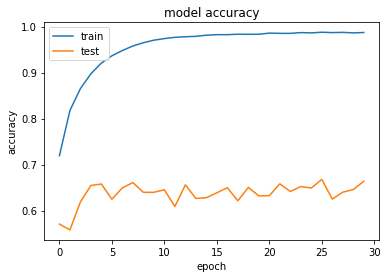

In [15]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


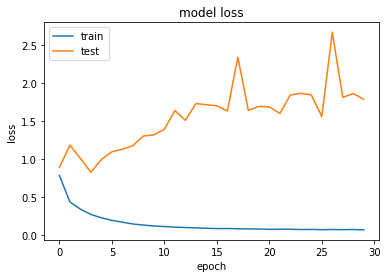

In [16]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Saving the First Model

In [17]:
model.save('Inception_v3_models/train_1')

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Square in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sum in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/repli

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

# Re-Training the model with FF++ dataset

In [18]:
re_model = tf.keras.models.load_model('Inception_v3_models/train_1/')
re_model.summary()

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/rep

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/dev

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableO

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableO

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableO

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableO

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableO

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableO

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableO

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableO

In [19]:
re_model.optimizer

In [20]:
re_model.get_weights()

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

[array([[[[-4.59105551e-01, -4.14526574e-02, -3.62577499e-03,
           -9.87672508e-02, -3.37070860e-02,  4.79929037e-02,
            2.32542142e-01,  3.23927671e-01,  5.90160079e-02,
            9.47738215e-02,  4.24996056e-02,  1.26620471e-01,
            1.33215979e-01,  1.22741833e-01, -7.92686343e-02,
            2.08227970e-02, -1.99647829e-01, -3.02687973e-01,
           -2.10659921e-01, -3.52898419e-01, -5.58023095e-01,
            3.20223093e-01,  4.53596050e-03, -3.09266411e-02,
           -6.86957911e-02,  2.00968519e-01,  1.14542745e-01,
            2.40372881e-01,  1.52943470e-02,  5.96231259e-02,
           -5.85714653e-02,  8.78173351e-01],
          [ 3.16376328e-01, -4.78494260e-03, -6.84681814e-03,
            7.44503662e-02, -1.97458476e-01,  5.20143658e-02,
           -1.24460436e-01,  3.36123914e-01,  3.01678218e-02,
           -1.26477107e-01, -1.05597451e-01, -5.31241074e-02,
           -2.43102223e-01,  1.66047230e-01, -1.03186309e-01,
           -6.55613691e-

In [21]:
train_ds_2 = train_dp(dataset_split('ff++'))
val_ds_2 = val_dp(dataset_split('ff++'))

Found 9736 images belonging to 2 classes.
Found 2432 images belonging to 2 classes.


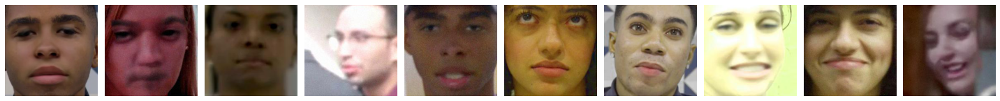

[0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 1. 0.
 1. 0. 1. 0. 1. 1. 1. 0.]


In [22]:
imgs, labels = next(train_ds_2)
plotImages(imgs)
print(labels)

In [34]:
from keras import backend as K
# To get learning rate
print(K.get_value(re_model.optimizer.learning_rate))
# To set learning rate
K.set_value(re_model.optimizer.learning_rate, 0.00001)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
1e-05
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0


In [35]:
re_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 111, 111, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 111, 111, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [37]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
checkpoint = ModelCheckpoint('Inception_v3_models/Inception_v3_2.h5', monitor='val_acc', verbose=1, save_best_only=True, mode='max')
early = EarlyStopping(monitor='val_acc', min_delta=0, patience=20, verbose=1, mode='auto')

history = re_model.fit(x=train_ds_2, steps_per_epoch=len(train_ds_2),validation_data=val_ds_2, 
                         validation_steps=len(val_ds_2), epochs=15, callbacks=[checkpoint,early])

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executin

125/305 [===========>..................] - ETA: 17s - loss: 2.5133 - acc: 0.6392Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


215/305 [====================>.........] - ETA: 8s - loss: 2.0611 - acc: 0.6463Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 1.7341 - acc: 0.6542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executin

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 97/305 [========>.....................] - ETA: 19s - loss: 0.8330 - acc: 0.6765Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


187/305 [=================>............] - ETA: 11s - loss: 0.7799 - acc: 0.6864Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


277/305 [==========================>...] - ETA: 2s - loss: 0.7401 - acc: 0.6952Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.7335 - acc: 0.6966Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

118/305 [==========>...................] - ETA: 17s - loss: 0.6065 - acc: 0.7383Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


208/305 [===================>..........] - ETA: 9s - loss: 0.6004 - acc: 0.7367Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


298/305 [============================>.] - ETA: 0s - loss: 0.5946 - acc: 0.7416Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.5923 - acc: 0.7429Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

 94/305 [========>.....................] - ETA: 19s - loss: 0.5353 - acc: 0.7663Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


184/305 [=================>............] - ETA: 11s - loss: 0.5338 - acc: 0.7717Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


274/305 [=========================>....] - ETA: 2s - loss: 0.5285 - acc: 0.7758Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.5241 - acc: 0.7782Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

 95/305 [========>.....................] - ETA: 19s - loss: 0.4944 - acc: 0.7944Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


185/305 [=================>............] - ETA: 11s - loss: 0.4872 - acc: 0.7975Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


275/305 [==========================>...] - ETA: 2s - loss: 0.4849 - acc: 0.7999Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.4804 - acc: 0.8020Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

140/305 [============>.................] - ETA: 15s - loss: 0.4323 - acc: 0.8182Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


230/305 [=====================>........] - ETA: 7s - loss: 0.4345 - acc: 0.8243Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.4342 - acc: 0.8249Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

140/305 [============>.................] - ETA: 15s - loss: 0.4178 - acc: 0.8413Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


230/305 [=====================>........] - ETA: 7s - loss: 0.4102 - acc: 0.8460Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.4070 - acc: 0.8473Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

140/305 [============>.................] - ETA: 15s - loss: 0.3894 - acc: 0.8525Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


230/305 [=====================>........] - ETA: 7s - loss: 0.3807 - acc: 0.8576Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.3797 - acc: 0.8568Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

116/305 [==========>...................] - ETA: 17s - loss: 0.3620 - acc: 0.8723Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


206/305 [===================>..........] - ETA: 9s - loss: 0.3557 - acc: 0.8767Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


296/305 [============================>.] - ETA: 0s - loss: 0.3601 - acc: 0.8716Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.3593 - acc: 0.8723Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

161/305 [==============>...............] - ETA: 13s - loss: 0.3309 - acc: 0.8822Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


251/305 [=======================>......] - ETA: 5s - loss: 0.3316 - acc: 0.8821Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.3334 - acc: 0.8822Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

161/305 [==============>...............] - ETA: 13s - loss: 0.3075 - acc: 0.8941Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


251/305 [=======================>......] - ETA: 5s - loss: 0.3162 - acc: 0.8911Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.3143 - acc: 0.8929Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 92/305 [========>.....................] - ETA: 20s - loss: 0.2987 - acc: 0.8988Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


182/305 [================>.............] - ETA: 11s - loss: 0.3000 - acc: 0.8970Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


272/305 [=========================>....] - ETA: 3s - loss: 0.2992 - acc: 0.8985Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.3006 - acc: 0.8977Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

 93/305 [========>.....................] - ETA: 20s - loss: 0.2778 - acc: 0.9123Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


183/305 [=================>............] - ETA: 11s - loss: 0.2738 - acc: 0.9108Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


273/305 [=========================>....] - ETA: 3s - loss: 0.2773 - acc: 0.9104Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.2753 - acc: 0.9105Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

 94/305 [========>.....................] - ETA: 19s - loss: 0.2757 - acc: 0.9125Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


184/305 [=================>............] - ETA: 11s - loss: 0.2668 - acc: 0.9152Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


274/305 [=========================>....] - ETA: 2s - loss: 0.2607 - acc: 0.9170Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.2578 - acc: 0.9182Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

 95/305 [========>.....................] - ETA: 19s - loss: 0.2385 - acc: 0.9293Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


185/305 [=================>............] - ETA: 11s - loss: 0.2423 - acc: 0.9267Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


275/305 [==========================>...] - ETA: 2s - loss: 0.2471 - acc: 0.9231Executing op __inference_train_function_171524 in device /job:localhost/replica:0/task:0/device:GPU:0


305/305 [==============================] - ETA: 0s - loss: 0.2451 - acc: 0.9236Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_174072 in device /job:localhost/replica:0/task:0/dev

dict_keys(['loss', 'acc', 'val_loss', 'val_acc'])


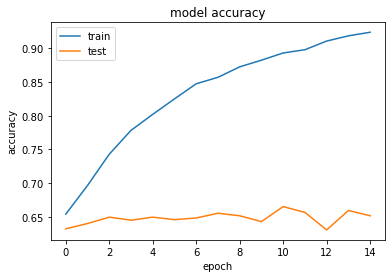

In [38]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


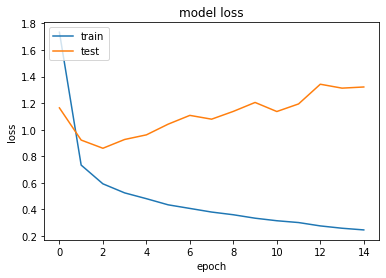

In [39]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Saving the Inception_v3 model

In [40]:
re_model.save('Inception_v3_models/train_2/')

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Square in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sum in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/repli

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitialize

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitialize

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitialize

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitialize

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitialize

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitialize

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitialize

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitialize